General Plan

1. загрузить датасет
2. предобработка
3. сделать velocity
4. каким кластеарм соответствуют неправильно определенные стрелки?
4.1 посмотреть особенности этих кластеров (метрики качества в каждом из них отдельно)
5. какие гены маркерные для этих кластеров?
6. какие гены вообще HVG в этих кластерах?
7. с самом туториали scVelo посмотреть те гены, по которым были определены направления неправильно (dynamical modeling & differential kinetics)
8. нарисовать фазовые портреты этих генов
9. какие из этих генов имеют сложные фазовые портреты?
10. можнно сравнить HVG, маркерные гены и гены для велосити

11. попробовать провести univeloT (метод "учит" латентное время сразу по всем генам, в отличие от scVelo) и сравнить есть ли у него такие же неправильные направления



Установка пакетов

In [2]:
!pip install seaborn numpy "scanpy[leiden]" scvelo scrublet cellrank

In [3]:
!pip install scFates

Импорт библиотек

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

import scanpy as sc
import scanpy.external as sce
import scFates as scf

In [5]:
import scvelo as scv

Настройка параметров

In [6]:
sc.settings.verbosity = 3
sns.set(font_scale=1)
sc.settings.set_figure_params(dpi=150)
sns.set_style("ticks")

Загрузка датасета

Создаем anndata object

In [7]:
adata = sc.read_10x_h5('/Users/karina/projects/scRNAseq/spermatogenesis_filtered_feature_bc_matrix.h5')

reading /Users/karina/projects/scRNAseq/spermatogenesis_filtered_feature_bc_matrix.h5
 (0:00:00)


In [8]:
adata_raw = adata.copy()

In [9]:
adata

AnnData object with n_obs × n_vars = 4008 × 33207
    var: 'gene_ids', 'feature_types', 'genome'

Посмотрим на то, какие у нас каунты

In [10]:
adata.X.max()

7026.0

Данные без препроцессинга, нужно будет его сделать. Но сначала сделаем QC, чтобы потом посмотреть в нем ли проблема с велосити

In [11]:
adata.obs.index = [bc.split("-")[0] for bc in adata.obs.index]
adata.var_names_make_unique()
adata.var["MT"] = adata.var_names.str.startswith("mt-")
adata.var

,gene_ids,feature_types,genome,MT
Gm15178,ENSMUSG00000086053,Gene Expression,mm39,False
Gm29155,ENSMUSG00000100764,Gene Expression,mm39,False
C730036E19Rik,ENSMUSG00000102095,Gene Expression,mm39,False
Gm29157,ENSMUSG00000100635,Gene Expression,mm39,False
Gm29156,ENSMUSG00000100480,Gene Expression,mm39,False
...,...,...,...,...
mt-Nd4l,ENSMUSG00000065947,Gene Expression,mm39,True
mt-Nd4,ENSMUSG00000064363,Gene Expression,mm39,True
mt-Nd5,ENSMUSG00000064367,Gene Expression,mm39,True
mt-Nd6,ENSMUSG00000064368,Gene Expression,mm39,True


In [12]:
sc.pp.calculate_qc_metrics(adata, log1p=False, percent_top=None, qc_vars=["MT"], inplace=True)

In [13]:
adata.var

,gene_ids,feature_types,genome,MT,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
Gm15178,ENSMUSG00000086053,Gene Expression,mm39,False,0,0.000000,100.000000,0.0
Gm29155,ENSMUSG00000100764,Gene Expression,mm39,False,21,0.005489,99.476048,22.0
C730036E19Rik,ENSMUSG00000102095,Gene Expression,mm39,False,0,0.000000,100.000000,0.0
Gm29157,ENSMUSG00000100635,Gene Expression,mm39,False,0,0.000000,100.000000,0.0
Gm29156,ENSMUSG00000100480,Gene Expression,mm39,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...,...
mt-Nd4l,ENSMUSG00000065947,Gene Expression,mm39,True,363,0.148952,90.943114,597.0
mt-Nd4,ENSMUSG00000064363,Gene Expression,mm39,True,1595,6.802645,60.204591,27265.0
mt-Nd5,ENSMUSG00000064367,Gene Expression,mm39,True,861,0.640968,78.517964,2569.0
mt-Nd6,ENSMUSG00000064368,Gene Expression,mm39,True,83,0.023204,97.929142,93.0


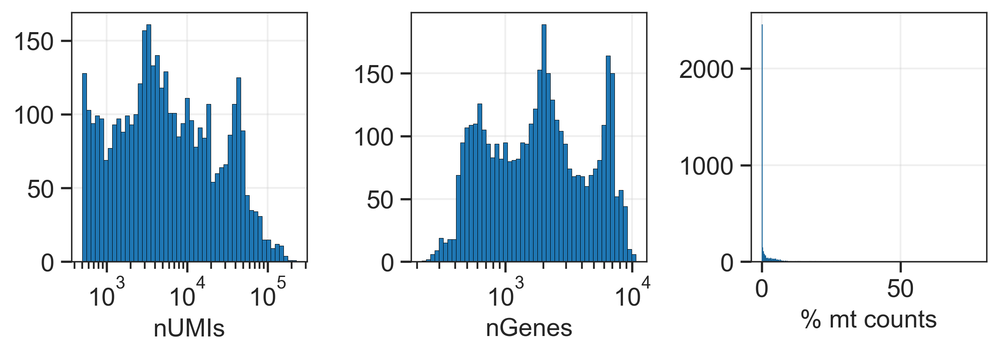

In [14]:
fig, axes = plt.subplots(ncols=3, figsize=(8, 3))

sns.histplot(adata.obs.total_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[0])
axes[0].set_ylabel("")
axes[0].set_xlabel("nUMIs")
axes[0].grid(alpha=0.3)

sns.histplot(adata.obs.n_genes_by_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[1])
axes[1].set_ylabel("")
axes[1].set_xlabel("nGenes")
axes[1].grid(alpha=0.3)

sns.histplot(adata.obs.pct_counts_MT, alpha=1, edgecolor="black", ax=axes[2])
axes[2].set_ylabel("")
axes[2].set_xlabel("% mt counts")
axes[2].grid(alpha=0.3)

fig.tight_layout()

распределение как будто бы мультимодальное, мы это попробуем поправить фильтрацией!

In [15]:
min_UMI = 11000
min_genes = 1000
max_mt = 5

adata_tmp = adata[
    (adata.obs.total_counts >= min_UMI) &
    (adata.obs.n_genes_by_counts >= min_genes) &
    (adata.obs.pct_counts_MT <= max_mt)
].copy()

In [16]:
adata = adata_tmp.copy()

In [17]:
sce.pp.scrublet(adata, threshold=0.2) #определяем дублеты
adata = adata[~adata.obs.predicted_doublet] #убираем дублеты

sc.pp.filter_genes(adata, min_counts=3) #фильтрация генов
sc.pp.normalize_total(adata, target_sum=10000) #нормализация
sc.pp.log1p(adata) #log-трансформация
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor="seurat") #выбираем HVG (НАДО ПОТОМ ПОПРОБОВАТЬ ЗДЕСЬ РАЗАНЫЕ ПАРАМЕТРЫ)
adata.raw = adata #засэйвили версию данных со всеми генами

adata = adata[:, adata.var.highly_variable] #взяли только HVG
sc.pp.scale(adata, max_value=10) #отшкалировали (НАДО ПОТОМ ПОПРОБОВАТЬ ЗДЕСЬ РАЗАНЫЕ ПАРАМЕТРЫ)

Running Scrublet
filtered out 9824 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
Detected doublet rate = 1.3%
Estimated detectable doublet fraction = 48.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 2.7%
    Scrublet finished (0:00:18)
filtered out 9892 genes that are detected in less than 3 counts
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata

In [18]:
sc.tl.pca(adata, n_comps=20) #вот здесть ТОЖЕ МОЖНО ПРОБОВАТЬ МЕНЯТЬ
sc.pp.neighbors(adata, n_neighbors=30) #вот здесть ТОЖЕ МОЖНО ПРОБОВАТЬ МЕНЯТЬ
sc.tl.umap(adata)

computing PCA
    on highly variable genes
    with n_comps=20
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 20


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [19]:
from matplotlib import rcParams
FIGSIZE=(2.5,2.5) #зафиксируем параметры для картинок scanpy
rcParams['figure.figsize']=FIGSIZE

Кластеризуем и отрисовываем на UMAP и на РСА

running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


<Axes: title={'center': 'Clusters'}, xlabel='X_pca1', ylabel='X_pca2'>

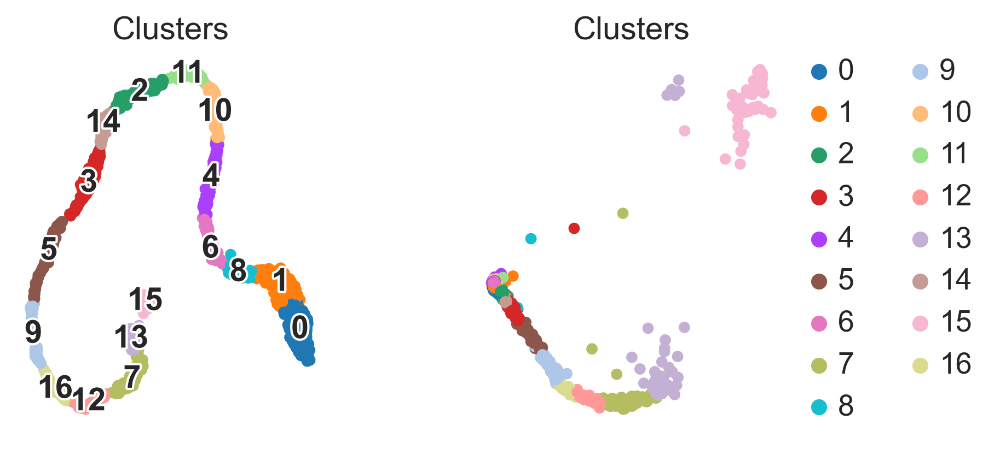

In [20]:
sc.tl.leiden(adata, resolution=1) #кластеризация

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,3), gridspec_kw={'wspace':0.5})

sc.pl.umap(adata, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters", ax = ax1, show=False)
sc.pl.embedding(adata, basis = 'X_pca', color = 'leiden', legend_fontoutline=2, frameon=False, title="Clusters", ax = ax2, show=False)

14 из 15ти кластеров связаны четенько между собой, а один лежит отдельно - есть ли в этом скрытый смысл? посмотрим на метрики качества

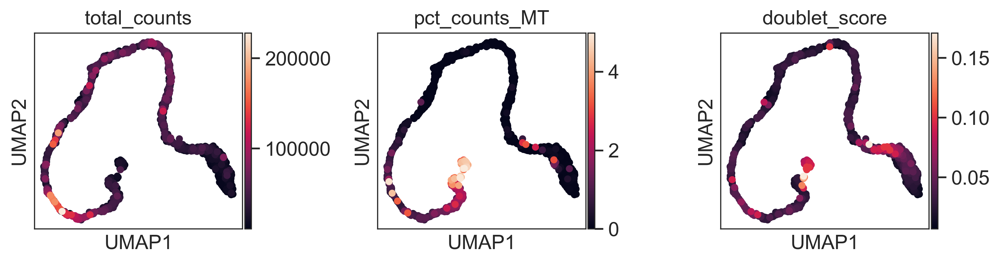

In [21]:
sc.pl.umap(adata, color = ['total_counts', 'pct_counts_MT', 'doublet_score'], wspace=0.5)

В 15ом кластере высокий процент МТХ генов - клетки были видимо поврежденные (моя гипотеза, что это были клетки Сертоли. То есть что тут не только технический кластер, но он и биологический смысл тоже может иметь). На РСА это тоже можно посмотреть.

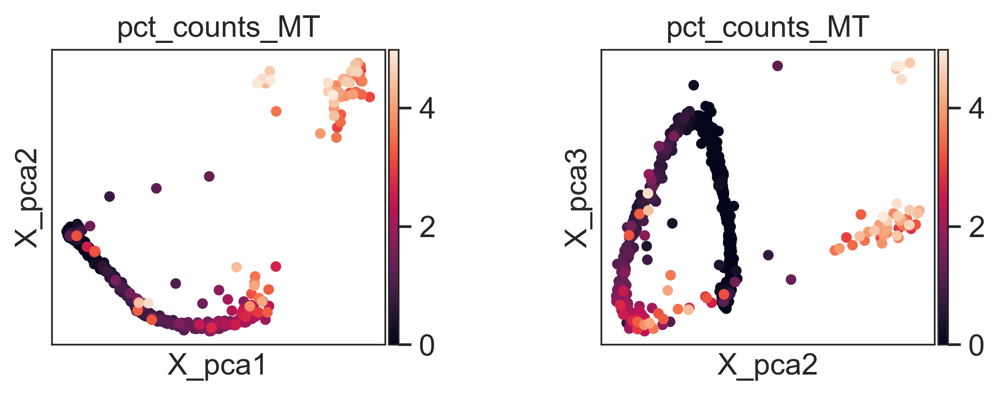

In [22]:
sc.pl.embedding(adata, basis = 'X_pca', components = ['1,2', '2,3'], color = 'pct_counts_MT', wspace = 0.5)

у нас есть выбросы и эти выбросы хорошо отделяются по проценту МТХ каунтов

МОЖНО ПОПРОБОВАТЬ ИХ ОТФИЛЬТРОВАТЬ ПОЖЕСТЧЕ (тут фильтруем уже адату только с HVG)

In [23]:
max_mt = 2

adata_pct_mt_2 = adata[adata.obs.pct_counts_MT <= max_mt].copy()

<Axes: title={'center': 'pct_counts_MT'}, xlabel='X_pca1', ylabel='X_pca2'>

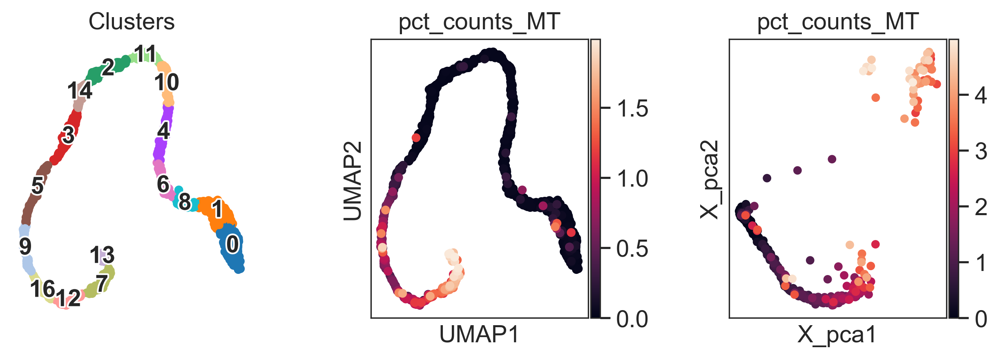

In [24]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,3), gridspec_kw={'wspace':0.5})

sc.pl.umap(adata_pct_mt_2, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters", ax = ax1, show=False)
sc.pl.umap(adata_pct_mt_2, color = 'pct_counts_MT', ax = ax2, show=False)
sc.pl.embedding(adata, basis = 'X_pca', components = ['1,2'], color = 'pct_counts_MT', ax = ax3, show=False)

Фильтр 2% не убирает 15ый кластер полностью. Но фильтр 1% убирает уже не только 15ый, но и 7ой кластер (МОЖНО ПОТОМ ПОСМОТРЕТЬ КАК ЭТИ КЛАСТЕРЫ СВЯЗАНЫ В БИОЛОГИЧЕСКОМ СМЫСЛЕ). И выбросы исчезают на РСА.

<Axes: title={'center': 'Clusters'}, xlabel='X_pca1', ylabel='X_pca2'>

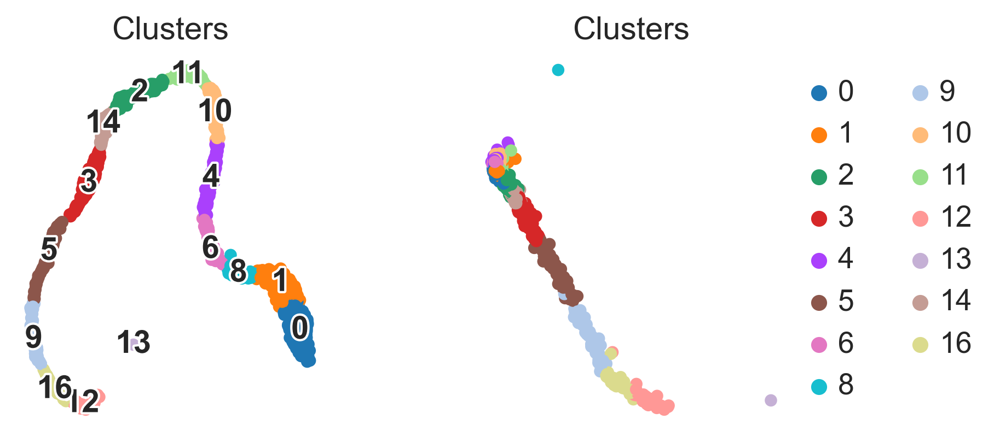

In [25]:
max_mt = 1

adata_pct_mt_1 = adata[adata.obs.pct_counts_MT <= max_mt].copy()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6,3), gridspec_kw={'wspace':0.5})

sc.pl.umap(adata_pct_mt_1, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters", ax = ax1, show=False)
sc.pl.embedding(adata_pct_mt_1, basis = 'X_pca', color = 'leiden', legend_fontoutline=2, frameon=False, title="Clusters", ax = ax2, show=False)

scFates связыват 15ый кластер в одну траекторию

inferring a principal tree --> parameters used 
    200 principal points, sigma = 1, lambda = 50, metric = euclidean
    fitting:  16%|█▌        | 32/200 [00:00<00:04, 34.94it/s]
    converged
    finished (0:00:00) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


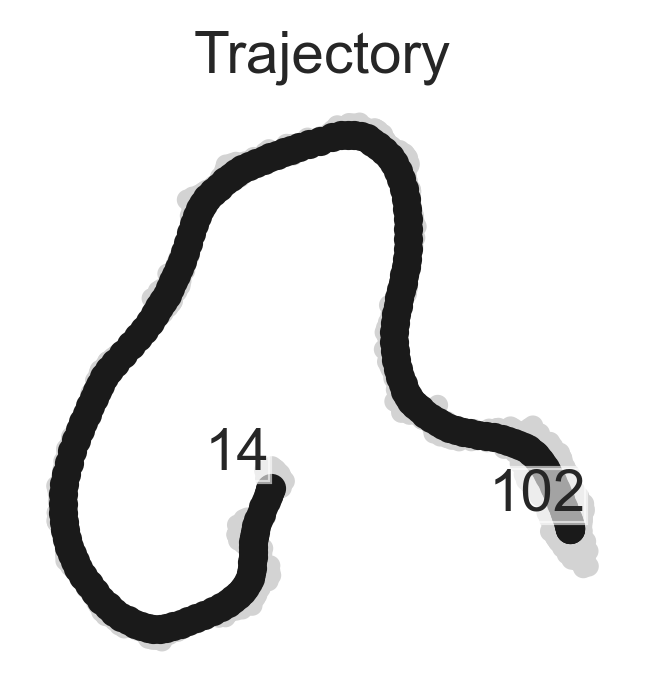

In [26]:
scf.tl.tree(adata, method="ppt", Nodes=200, use_rep="umap", device="cuda:0",
            ppt_lambda=50, ppt_sigma=1, ppt_nsteps=200)
scf.pl.graph(adata, basis="umap", frameon=False, title="Trajectory")

От фильтрации траектория не поменялась

inferring a principal tree --> parameters used 
    200 principal points, sigma = 1, lambda = 50, metric = euclidean
    fitting:   0%|          | 0/200 [00:00<?, ?it/s]

    fitting:   4%|▍         | 9/200 [00:00<00:07, 25.78it/s]
    converged
    finished (0:00:00) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


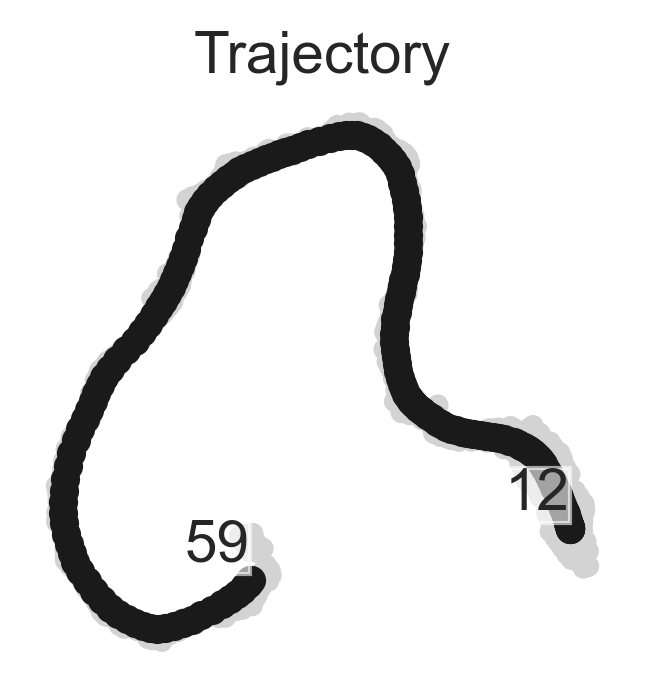

In [27]:
scf.tl.tree(adata_pct_mt_2, method="ppt", Nodes=200, use_rep="umap", device="cuda:0",
            ppt_lambda=50, ppt_sigma=1, ppt_nsteps=200)
scf.pl.graph(adata_pct_mt_2, basis="umap", frameon=False, title="Trajectory")

Далее будем применять scVelo

In [28]:
adata = adata.raw.to_adata()

adata_splicing = sc.read_loom("spermatogenesis_velocyto.loom")
adata_splicing.var_names_make_unique()
adata_splicing.obs.index = [bc.split(":")[1][:-1] for bc in adata_splicing.obs.index]
for layer in ["ambiguous", "spliced", "unspliced"]:
    adata.layers[layer] = adata_splicing[adata.obs_names, adata.var_names].layers[layer].copy()

In [29]:
adata.raw = adata

scv.pp.filter_and_normalize(adata, min_shared_counts=5, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30) #вроде бы тут по дефолту стоит использовать только HVG для вычисления моментов, проверим!

Filtered out 11158 genes that are detected 5 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.ht

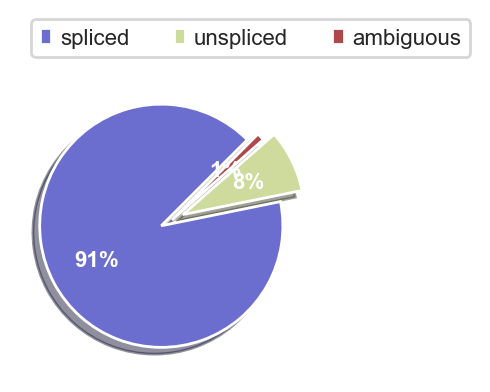

In [30]:
scv.pl.proportions(adata)

In [31]:
adata_uni = adata.copy()

In [32]:
scv.tl.recover_dynamics(adata, n_jobs=2)
scv.tl.velocity(adata, mode="dynamical")
scv.tl.velocity_graph(adata)

recovering dynamics (using 2/8 cores)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/1558 [00:00<?, ?gene/s]

    finished (0:01:19) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/8 cores)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/1208 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


Ячейка выше выполнялась по 1558 генам - что это были за гены? HVG мы отобрали больше - 2000 (ниже перепроверим)

In [33]:
adata.var['velocity_genes'].sum()

1306

In [34]:
adata.var.highly_variable[:]

Pcmtd1           True
Uxs1             True
Tsn              True
Mybl1            True
Gm8251           True
                 ... 
Unc93b1          True
Prdx5            True
Fkbp2            True
4931408D14Rik    True
Malat1           True
Name: highly_variable, Length: 2000, dtype: bool

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


<Axes: title={'center': 'Clusters UMAP'}, xlabel='UMAP1', ylabel='UMAP2'>

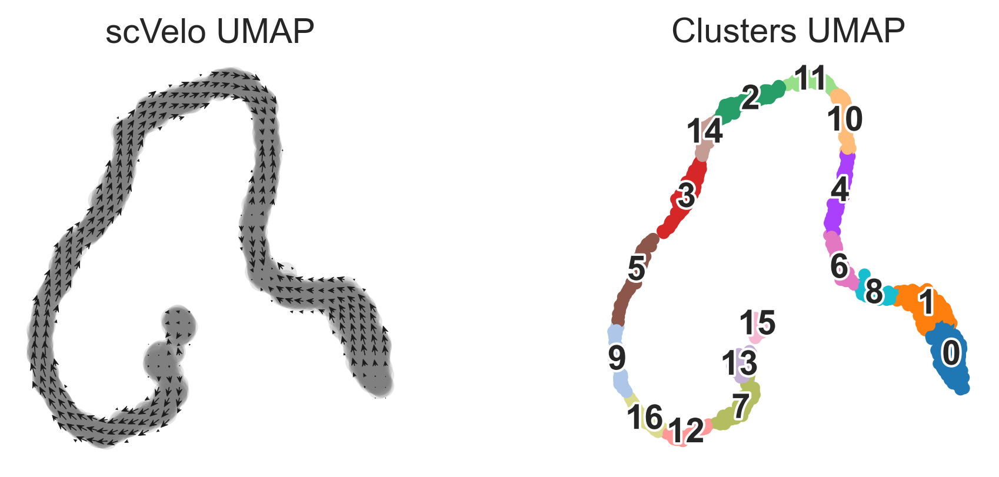

In [35]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7,3), gridspec_kw={'wspace':0.5})

scv.pl.velocity_embedding_grid(adata, basis="umap", arrow_size=3, arrow_length=2, arrow_color="k", title= "scVelo UMAP", density=0.7, ax=ax1, show = False)
sc.pl.umap(adata, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters UMAP", ax=ax2, show = False)


Пробую провести велосити на данных с более жесткой фильтрацией по мтх каунтам (при аннотации кластеров посмотрела, что это сильно меняет четкость кластеров (см.ниже))

In [36]:
max_mt = 2

adata_mt = adata[adata.obs.pct_counts_MT <= max_mt].copy()

Filtered out 541 genes that are detected 5 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
Logarithmized X.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 2/8 cores)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/916 [00:00<?, ?gene/s]

    finished (0:00:42) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing velocity graph (using 1/8 cores)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/1118 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


<Axes: title={'center': 'Clusters UMAP'}, xlabel='UMAP1', ylabel='UMAP2'>

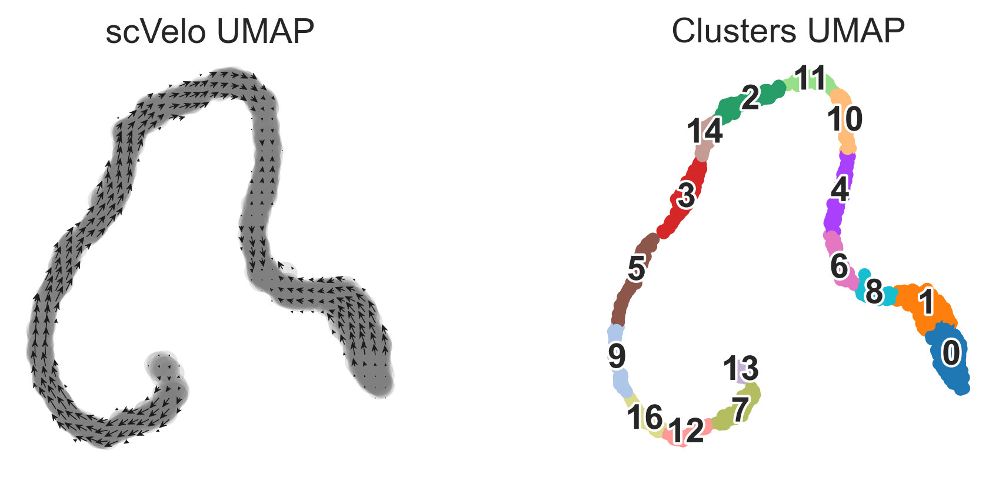

In [37]:
scv.pp.filter_and_normalize(adata_mt, min_shared_counts=5, n_top_genes=2000)
scv.pp.moments(adata_mt, n_pcs=30, n_neighbors=30)
scv.tl.recover_dynamics(adata_mt, n_jobs=2)
scv.tl.velocity(adata_mt, mode="dynamical")
scv.tl.velocity_graph(adata_mt)

<Axes: title={'center': 'Clusters UMAP'}, xlabel='UMAP1', ylabel='UMAP2'>

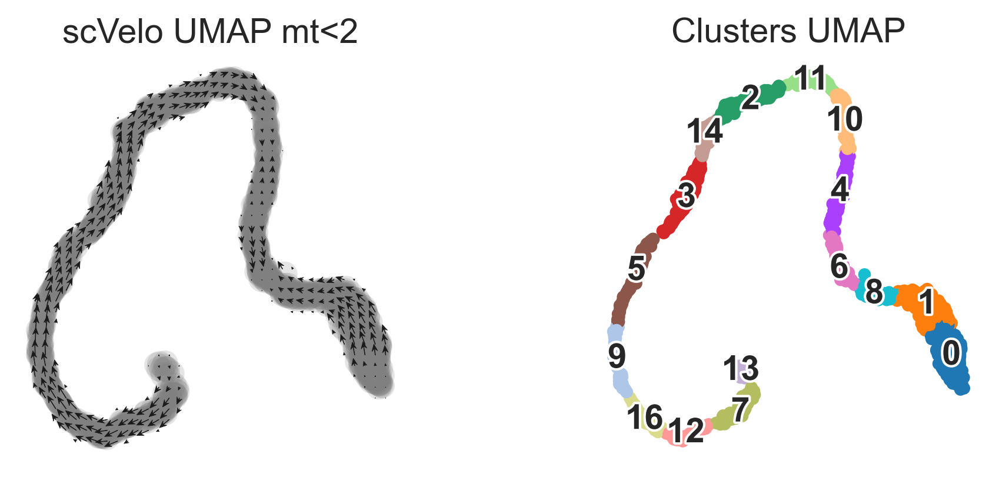

In [112]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7,3), gridspec_kw={'wspace':0.5})

scv.pl.velocity_embedding_grid(adata_mt, basis="umap", arrow_size=3, arrow_length=2, arrow_color="k", title= "scVelo UMAP mt<2", density=0.7, ax=ax1, show = False)
sc.pl.umap(adata_mt, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters UMAP", ax=ax2, show = False)

Видим, что проблема в переходах между кластерами 15->13, 10->4, 6->8 и вообще обратная траектория между кластерами 0-1-8. 
Надо прицельно смотреть, что может быть с ними не так. Есть 3 варианта объяснения:
1) проблема в самих данных
2) это артефакт работы scVelo 
3) в этих траекториях есть какой-то "биологический смысл"

Проблема в данных в случае с переходом 15->13. В кластере 15 повыше процент мтх каунтов

 

ВОТ ЗДЕСЬ ПРО ПРОБЛЕМУ В ДАННЫХ

ПРО БИОЛОГИЧЕСКИЙ СМЫСЛ

In [38]:
#попробуем понять что это за кластеры 

Буду аннотировать по маркерам из статьи Marioni https://doi.org/10.1038/s41467-019-09182-1

Rps11, Rpl14, Dazl - spermatogonia
Tex101, Ly6k, Prss50 - pre-leptotene
Hmgb2, Sycp1, Atp6v0b - early pachetene spermatocytes 1
Psma8, Gml, Stambp - early pachetene spermatocytes 2
Tmem30c, 4933440M02Rik, Elfn2 - mid pachytene
Mllt10, Mroh4, Pomclate - late pachyene 1
Vamp5, Gm17315, Cln6 - late pachyene 2
Pou5f2, Mxra8, 4932702P03Rik - diplotene
4931417E11Rik, Tmem202, Galntl6 - metaphase I
Ccna1, Rsph6a, Lyar - metaphase II
Ccnb1, Slco6c1, Rfx8 - spermatids 1
4921504E06Rik, Gm10376, Ssxb1 - spermatids 2
1700016G14Rik, Nipsnap3a, Prr27 - spermatids 3

Igfbp7 - endothelial cells
Hmgcs2, Insl3, Akr1cl - Leidig


ПРОСТО ИНТЕРЕСНОЕ

The highest number of genes was observed in diplotene spermatocytes (D), the latest cell-type in prophase I with active RNA synthesis.


Выберем наиболее удачные маркеры

посмотрим маркеры из статьи - подходят ли они нам?

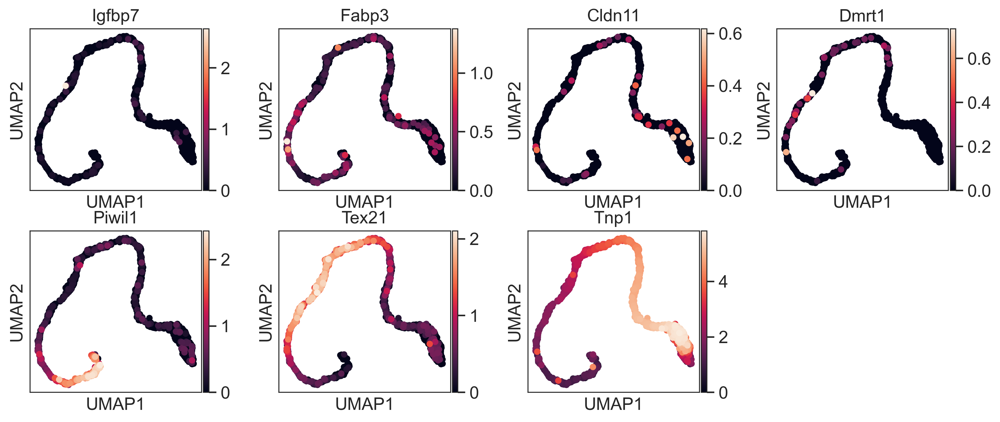

In [39]:
sc.pl.umap(adata_mt, color = ["Igfbp7", 'Fabp3', 'Cldn11', 'Dmrt1','Piwil1', 'Tex21', 'Tnp1']) #endothelial Leidig Sertoli Spermatogonia Spermatocytes Round_spermatids Elongating_spermatids

мы видим, что у нас кластеров больше, чем основных клеточных типов. кроме того, большАя часть клеток - это поздние стадии сперматогенеза, удлинняющиеся сперматиды (то есть клетки, которые превращаются в сперматозоди 1n1с). Известно, что в таких клетках динамика экспрессии сильно отличается от более ранних стадий. Тут больше происходят процессы деградации мРНК, чем синтеза

Далее просматриваю маркеры для наших кластеров - подтипы клеток

In [ ]:
#можно не запускать эту ячейку - слишком много графиков (я уже выбрала маркеры, исходя из графиков)
with plt.rc_context({'figure.figsize':(4,4)}):
    sc.pl.violin(adata_pct_mt_2, ['Rps11', 'Rpl14', 'Dazl'], groupby='leiden', title = "spermatogonia markers") #Dazl
    sc.pl.violin(adata_pct_mt_2, ['Tex101', 'Ly6k', 'Prss50'], groupby='leiden', title = "pre-leptotene markers") #Tex101
    sc.pl.violin(adata_pct_mt_2, ['Hmgb2', 'Sycp1', 'Atp6v0b'], groupby='leiden', title = "early pachytene 1 markers") #Atp6v0b
    sc.pl.violin(adata_pct_mt_2, ['Psma8', 'Gml', 'Stambp'], groupby='leiden', title = "early pachytene 2 markers") #Gml
    sc.pl.violin(adata_pct_mt_2, ['Tmem30c', '4933440M02Rik', 'Elfn2'], groupby='leiden', title = "mid pachytene markers") #Elfn2
    # sc.pl.violin(adata_pct_mt_2, ['Mllt10', 'Mroh4'], groupby='leiden', title = "late pachytene 1 markers")
    sc.pl.violin(adata_pct_mt_2, ['Vamp5', 'Gm17315', 'Cln6'], groupby='leiden', title = "late pachytene 2 markers") #Vamp5
    sc.pl.violin(adata_pct_mt_2, ['Pou5f2', 'Mxra8', '4932702P03Rik'], groupby='leiden', title = "diplotene markers") #Pou5f2
    # sc.pl.violin(adata_pct_mt_2, ['Tmem202', 'Galntl6'], groupby='leiden', title = "metaphase I markers")
    sc.pl.violin(adata_pct_mt_2, ['Ccna1', 'Rsph6a', 'Lyar'], groupby='leiden', title = "metaphase II markers") #Ccna1
    sc.pl.violin(adata_pct_mt_2, ['Ccnb1', 'Slco6c1', 'Rfx8'], groupby='leiden', title = "spermatids 1 markers") #Ccnb1
    sc.pl.violin(adata_pct_mt_2, ['4921504E06Rik', 'Gm10376', 'Ssxb1'], groupby='leiden', title = "spermatids 2 markers") #Ssxb1
    # sc.pl.violin(adata_pct_mt_2, ['Nipsnap3a', 'Prr27'], groupby='leiden', title = "spermatids 3 2 markers")


Отрисуем распределение на UMAP

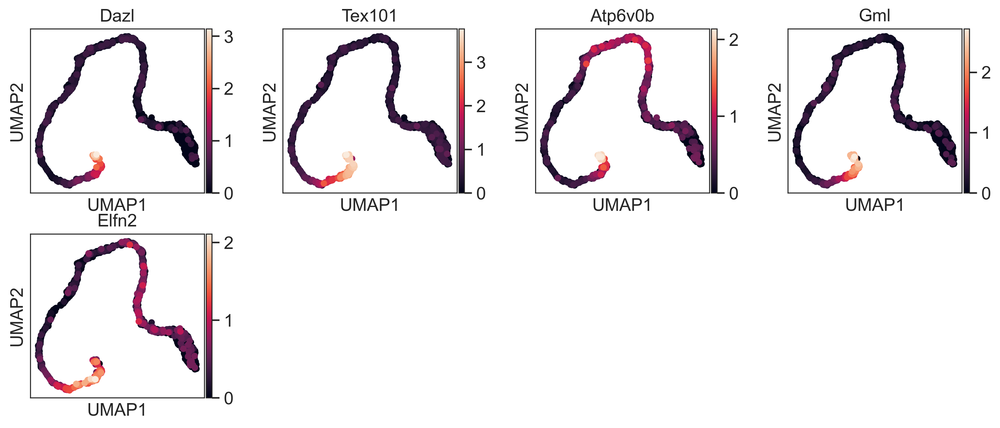

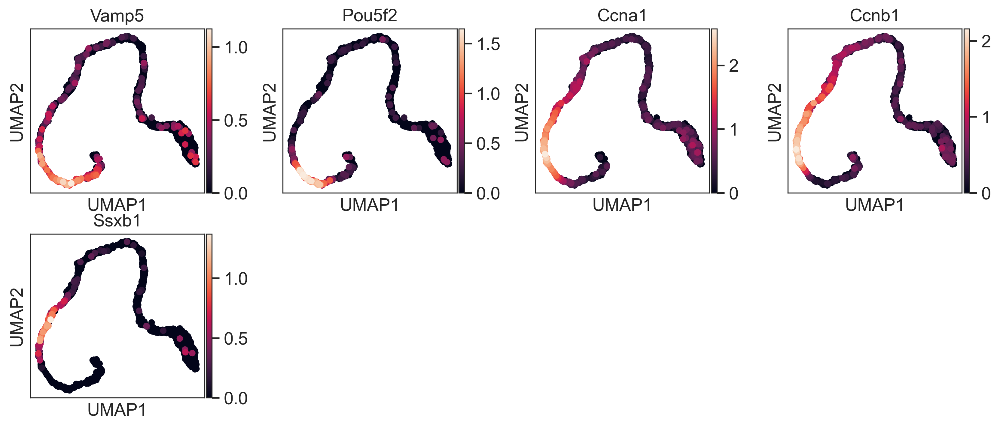

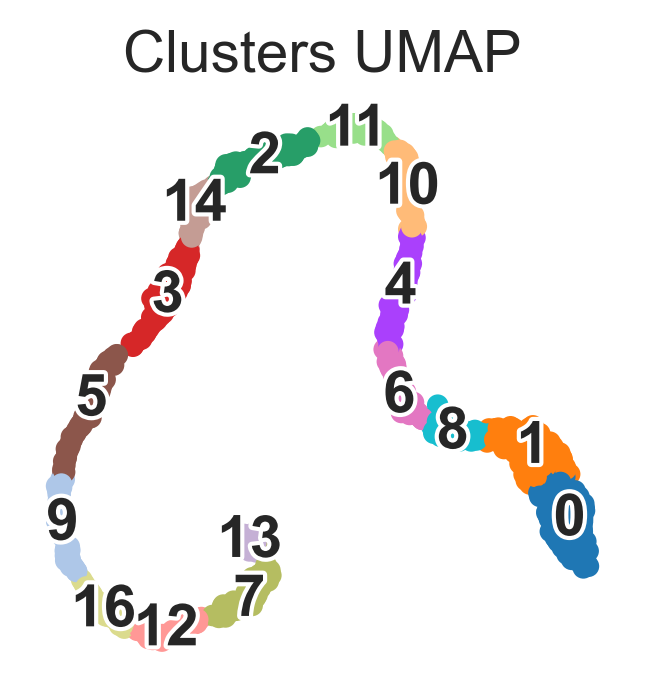

In [134]:

sc.pl.umap(adata_mt, color = ["Dazl", 'Tex101', 'Atp6v0b', 'Gml', 'Elfn2'])
sc.pl.umap(adata_mt, color = ['Vamp5', 'Pou5f2', 'Ccna1', 'Ccnb1', 'Ssxb1'])
sc.pl.umap(adata_mt, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters UMAP")

... storing 'cell_type_annotation' as categorical


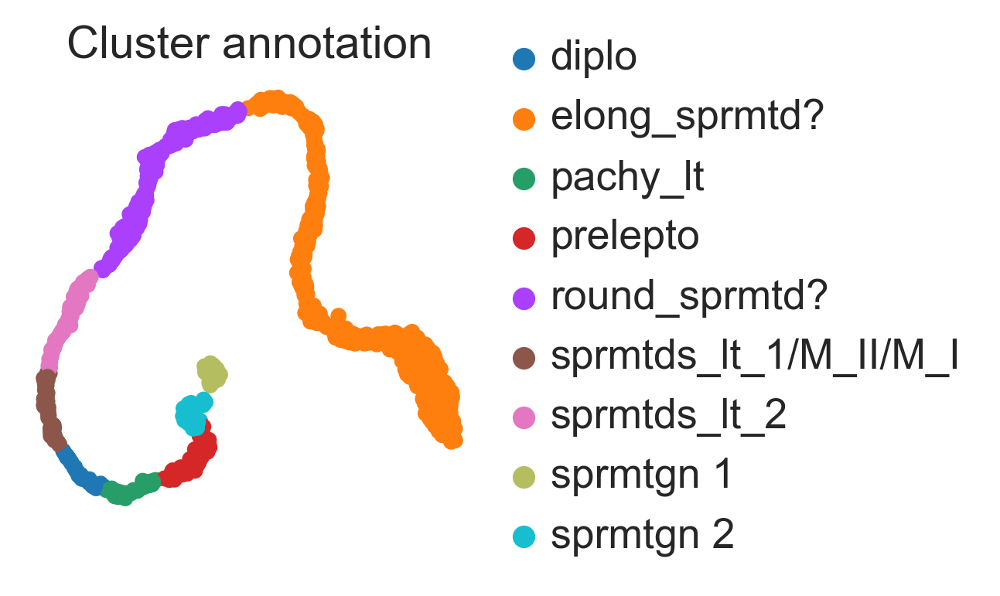

In [130]:
leiden_to_ct = {
    "0": "elong_sprmtd?",
    "1": "elong_sprmtd?",
    "2": "round_sprmtd?",
    "3": "round_sprmtd?",
    "4": "elong_sprmtd?",
    "5": "sprmtds_lt_2",
    "6": "elong_sprmtd?",
    "7": "prelepto",
    "8": "elong_sprmtd?",
    "9": "sprmtds_lt_1/M_II/M_I",
    "10": "elong_sprmtd?",
    "11": "elong_sprmtd?",
    "12": "pachy_lt",
    "13": "sprmtgn 2",
    "14": "round_sprmtd?",
    "15": "sprmtgn 1",
    "16": "diplo",
}

adata.obs["cell_type_annotation"] = [leiden_to_ct[leiden] for leiden in adata.obs.leiden]
sc.pl.umap(adata, color=["cell_type_annotation"], frameon=False, title = 'Cluster annotation')

получается на этом датасете все основные стадии сперматогенеза укладываются в половину всей траектории. А что тогда из себя представляет всё оставшееся - надо узнать! Видимо это все разные стадии удлинняющихся сперматид...

In [43]:
sc.tl.rank_genes_groups(adata, groupby="leiden")


ranking genes


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


В попытках обнаружить маркерные гены для кластеров 14, 2, 11, 10, 4, 6, 8, 1, 0 обнаружила интересную вещь. Если брать для этих кластеров гены с LFC больше 5, то генов с низким p-value или нет вообще или 1-2. При этом в кластерах, которые удалось аннотировать выше все было в порядке. При этом в неопознанных кластерах находятся гены с низким p-value при уменьшении порога на LFC до 3. Как буд-то бы большая часть клеток слабо отличается друг от друга. 

Посмотрим например на кластер 14

In [44]:
df = sc.get.rank_genes_groups_df(adata, group="14")
df[df.logfoldchanges > 5].head(10).sort_values(by ="pvals", ascending=True) 

,names,scores,logfoldchanges,pvals,pvals_adj
4374,Tmem100,1.897178,5.641110,0.064372,0.104697
4606,Gm28590,1.748147,6.376326,0.087407,0.135436
4630,Gpx5,1.736333,5.997537,0.089495,0.137892
4637,C230029F24Rik,1.733160,6.528064,0.090066,0.138524
4639,Gm47221,1.730061,6.319979,0.090622,0.139159
4752,Cysltr2,1.660571,7.168635,0.103909,0.155297
4789,Rab19,1.631804,5.304004,0.109844,0.162532
4963,Trhr,1.549009,5.681529,0.128539,0.185174
5212,Serpini2,1.412786,6.538173,0.164752,0.229393
5216,Xcl1,1.408849,6.070608,0.165901,0.230842


Попробуем визуализировать его "отличительные гены" (поставив порог на LFC пониже)

In [66]:
df = sc.get.rank_genes_groups_df(adata, group="14")
marker_genes_14 = df[df.logfoldchanges > 3].head(10).sort_values(by ="logfoldchanges", ascending=True).names.values
print("limit LFC = 5", df[df.logfoldchanges > 5].head(10).sort_values(by ="logfoldchanges", ascending=True))
print("limit LFC = 3", df[df.logfoldchanges > 3].head(10).sort_values(by ="logfoldchanges", ascending=True))

limit LFC = 5               names    scores  logfoldchanges     pvals  pvals_adj
4789          Rab19  1.631804        5.304004  0.109844   0.162532
4374        Tmem100  1.897178        5.641110  0.064372   0.104697
4963           Trhr  1.549009        5.681529  0.128539   0.185174
4630           Gpx5  1.736333        5.997537  0.089495   0.137892
5216           Xcl1  1.408849        6.070608  0.165901   0.230842
4639        Gm47221  1.730061        6.319979  0.090622   0.139159
4606        Gm28590  1.748147        6.376326  0.087407   0.135436
4637  C230029F24Rik  1.733160        6.528064  0.090066   0.138524
5212       Serpini2  1.412786        6.538173  0.164752   0.229393
4752        Cysltr2  1.660571        7.168635  0.103909   0.155297
limit LFC = 3             names     scores  logfoldchanges          pvals      pvals_adj
43           Sun5  32.095802        3.024105   5.689583e-43   5.597157e-41
32          Armh2  33.918331        3.059496   7.274222e-54   1.378849e-51
3   170006

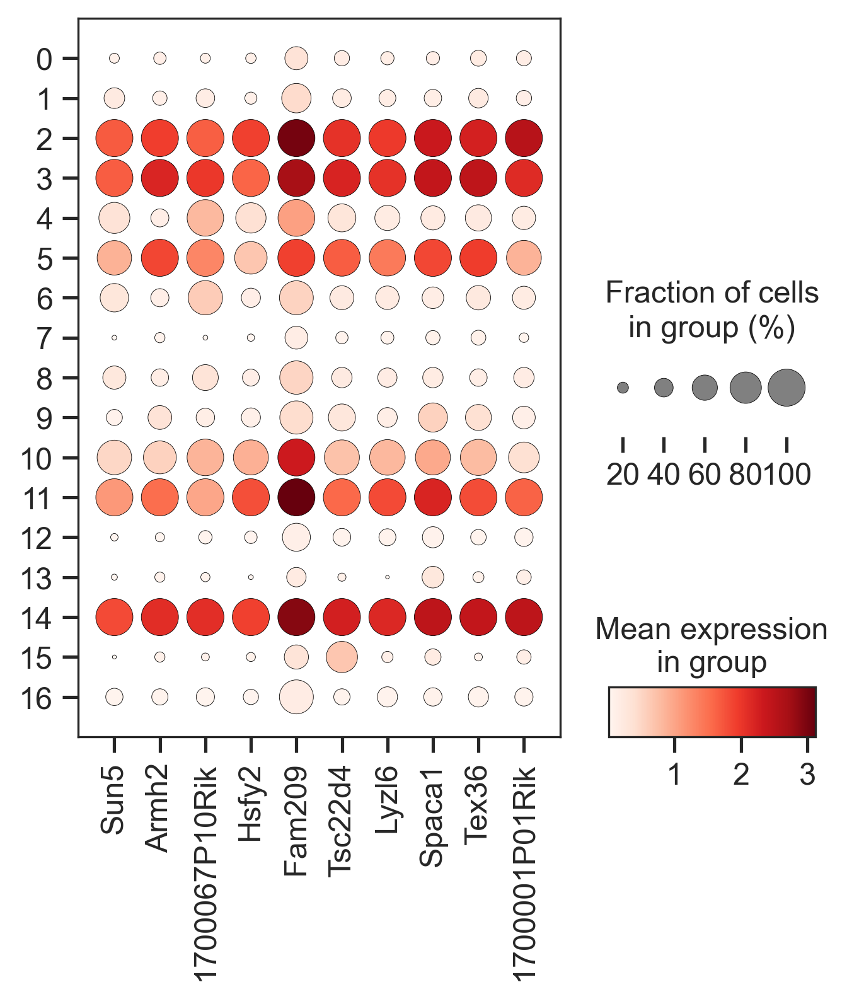

In [110]:
sc.pl.dotplot(adata, marker_genes_14, groupby='leiden', figsize =(5,5)) #отрисуем гены, которые имеют LFC > 3 и при этом низкое pval

Видим, что его кластер-специфичные гены не такие уж и специфичные для конкретно этого кластера

Посмотрим на self-transition - видим, что их много в той части, где кластеры довольно сгружены вместе и где наши неопознанные кластера

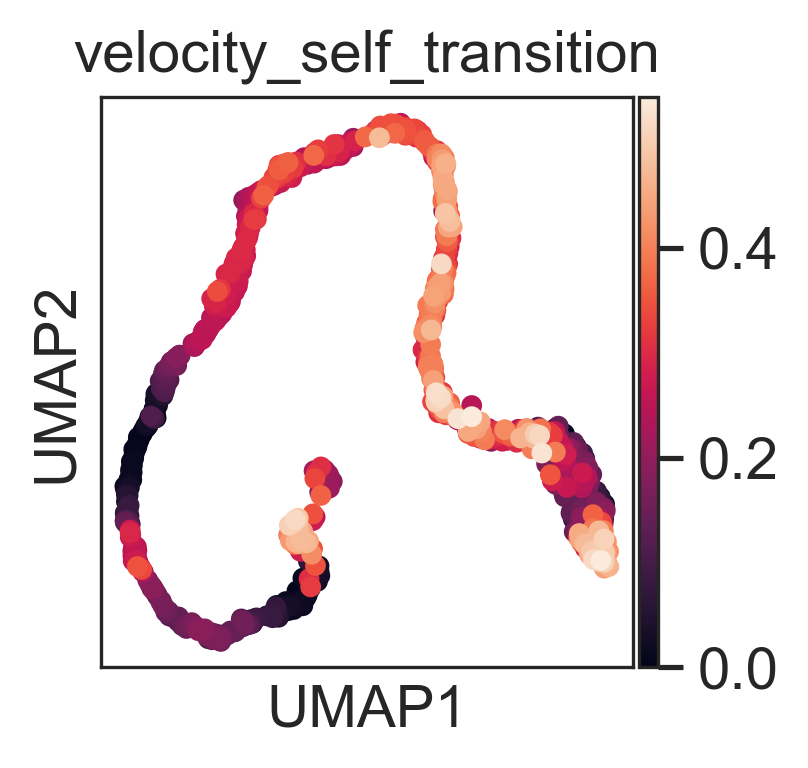

In [47]:
sc.pl.umap(adata, color = 'velocity_self_transition')

ВОТ ЗДЕСЬ ПРО АРТЕФАКТ РАБОТЫ ВЕЛОСИТИ

Пробуем посмотреть на другой метод определения направления дифферернцировки - velocyto (который по сути является determininistic mode в команде scv.tl.velocity()). Покажет ли он нам ту же картину?

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/8 cores)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/1208 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


<Axes: title={'center': 'Clusters UMAP'}, xlabel='UMAP1', ylabel='UMAP2'>

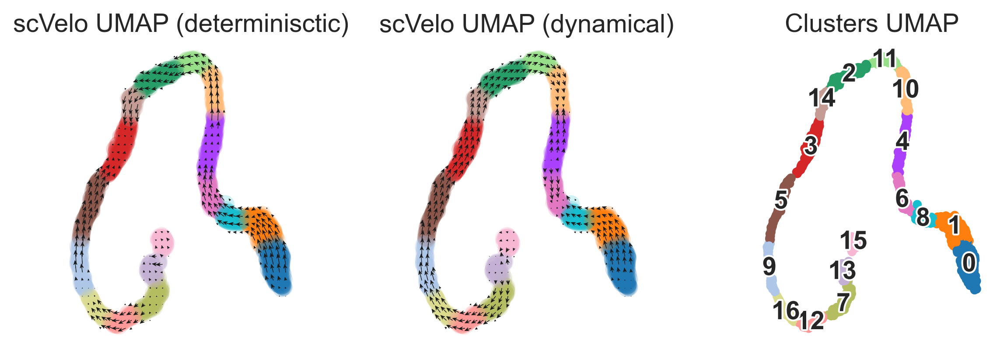

In [48]:
adata_determ = adata.copy()
del(adata_determ.layers['velocity'], adata_determ.layers['velocity_u'])

scv.tl.velocity(adata_determ, mode="deterministic")
scv.tl.velocity_graph(adata_determ)

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


<Axes: title={'center': 'Clusters UMAP'}, xlabel='UMAP1', ylabel='UMAP2'>

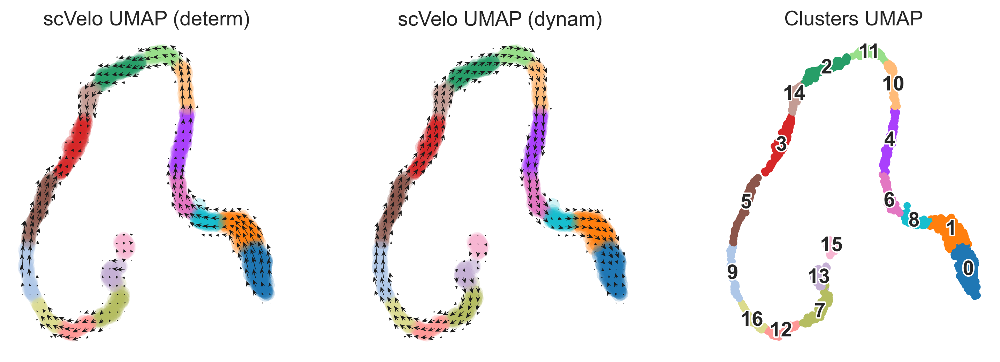

In [126]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,4), gridspec_kw={'wspace':0.3})

scv.pl.velocity_embedding_grid(adata_determ, color = 'leiden', basis="umap", arrow_size=3, arrow_length=2, arrow_color="k", title= "scVelo UMAP (determ)", density=0.7, ax=ax1, show = False)
scv.pl.velocity_embedding_grid(adata, basis="umap", color = 'leiden', arrow_size=3, arrow_length=2, arrow_color="k", title= "scVelo UMAP (dynam)", density=0.7, ax=ax2, show = False)
sc.pl.umap(adata_determ, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters UMAP", ax=ax3, show = False)

видим, что здесь по направлениям все еще хуже (этого стоило ожидать, потому что assumptions velocyto еще более далеки от реальности, чем у scVelo)

ПРОБУЕМ ПОСМОТРЕТЬ НА LATENT TIME

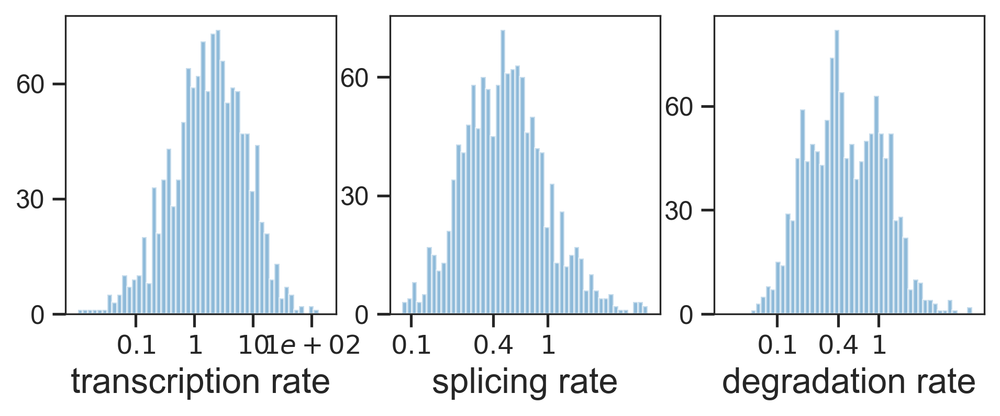

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
Pcmtd1,0.958411,1.014694,1.525641,0.832677,5.503243,0.326916,0.265853,0.441170,0.837595,0.0,0.0,0.410109,0.588227,1.066103,0.053086,1.035910
Uxs1,0.865061,4.728895,13.536830,1.029524,5.551747,0.036997,0.108109,1.314929,0.389090,0.0,0.0,0.491130,0.319272,4.188942,0.248722,0.898515
Mybl1,0.865226,2.203684,10.249320,0.551584,6.656474,0.088918,0.079023,1.288643,0.375509,0.0,0.0,0.475793,0.211720,2.730628,0.335109,1.591053
Catspere2,0.514279,0.237312,0.098376,0.157026,9.230634,4.353605,0.694818,0.276500,0.711277,0.0,0.0,0.456194,2.351703,0.595861,0.082695,3.467278
Smyd3,0.798359,1.122207,0.829374,0.990904,13.781744,1.396028,0.296334,0.286033,0.359577,0.0,0.0,0.465084,1.365498,0.724742,0.275648,1.108395


In [49]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


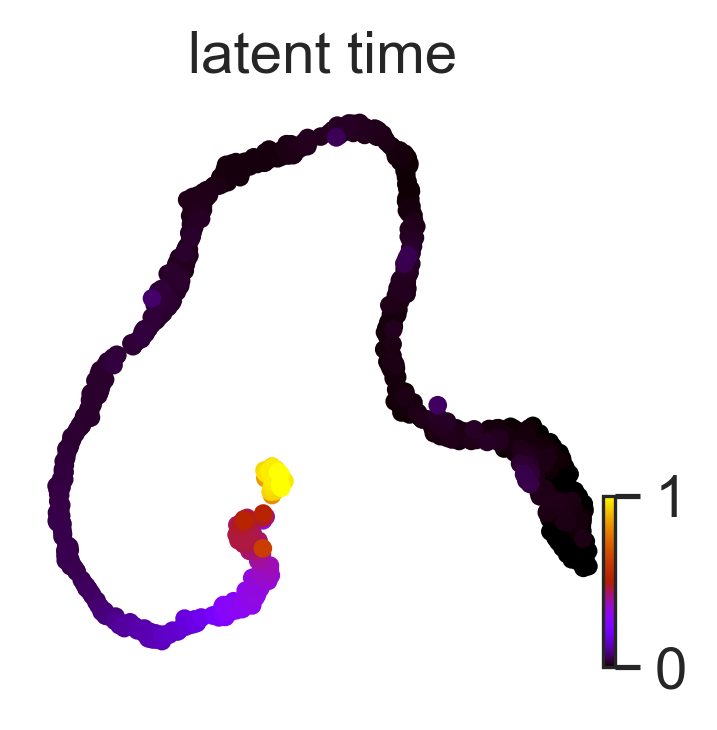

In [50]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

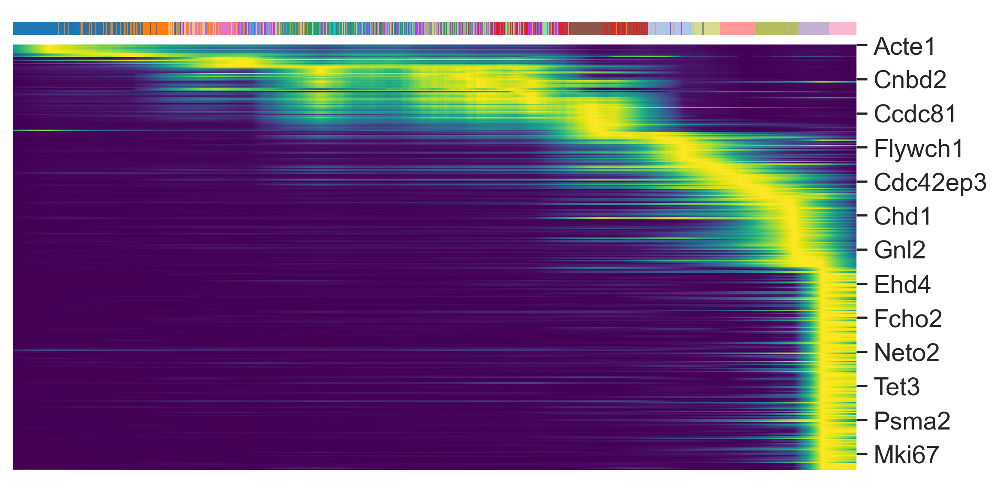

In [68]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='leiden', n_convolve=100)

Latent time как будто направлен в противоположную сторону

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

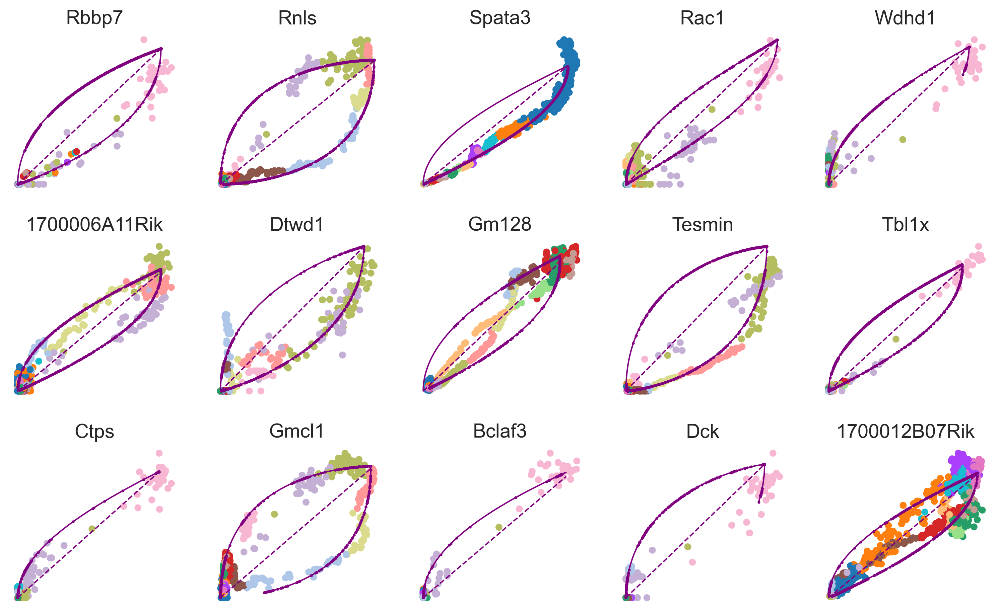

In [55]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False, color = 'leiden')

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


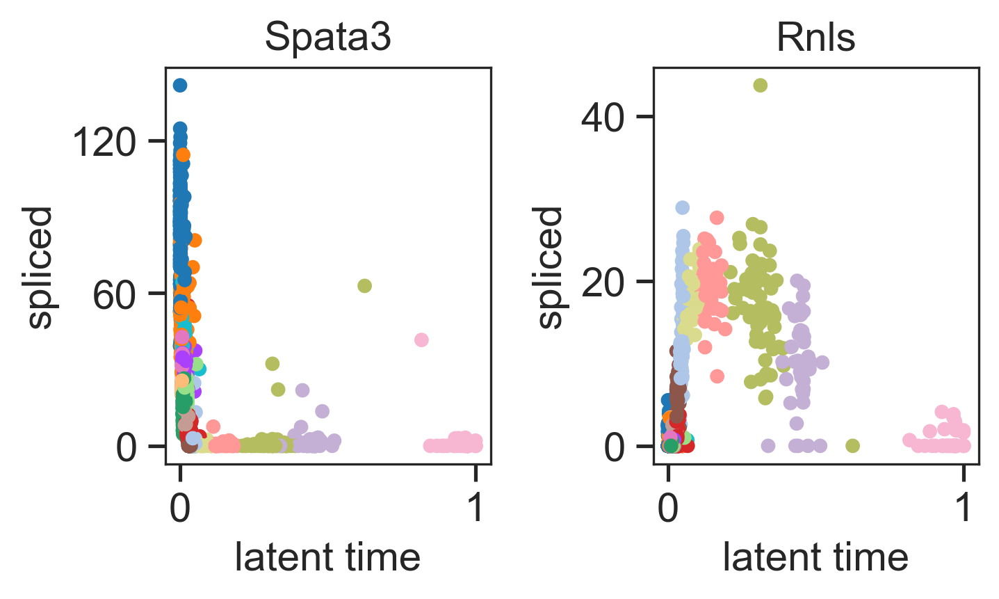

In [56]:
scv.pl.scatter(adata, x='latent_time', y=['Spata3', 'Rnls'], color = 'leiden', wspace = 0.5, ncols = 2)

Мы видим здесь для гена Spata3 как будто бы меденно растущую экспрессию, которую алгоритм воспринимает как снижающуюся из-за формы кривой (вогнутая)

Для отдельных кластеров 

In [58]:
scv.tl.rank_dynamical_genes(adata, groupby='leiden')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:00) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,Gm16226,Spata3,Gm128,Pphln1,Dcdc2c,Gm128,Spata3,Pds5b,Spata3,Mllt10,Aqp7,Aqp7,Gmcl1,Fam118b,1700113H08Rik,Adgrl1,Mllt10
1,Spata3,Cstl1,1700012B07Rik,1700012B07Rik,1700029H14Rik,Spag16,1700012B07Rik,Fam118b,1700012B07Rik,Gmcl1,Pttg1ip2,Tssk4,Adad1,Cdc42ep3,1700012B07Rik,Rnaseh2b,Zfp771
2,Gm5893,Gabarapl1,1700113H08Rik,Adad1,Spata3,Grtp1,Aqp7,Mllt10,1700029H14Rik,Rnls,Cstl1,Fam78a,Rnls,Pds5b,Lyzl1,Rac1,Nxn
3,1700034E13Rik,Samd4,Tmem249,Gm128,Cstl1,Aqp7,1700029H14Rik,Cdc42ep3,Fam71f1,Slc6a6,Ccdc81,1700012B07Rik,Nxn,Adad1,Plac8l1,Dck,Adam2
4,Spata18,Pwwp2b,Tssk4,Plac8l1,Pttg1ip2,Tmem249,Cstl1,Zfp771,Pwwp2b,Ovol2,4930544D05Rik,Samd4,Tdrd12,Trpm7,Tssk4,Rbbp7,Rnls


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

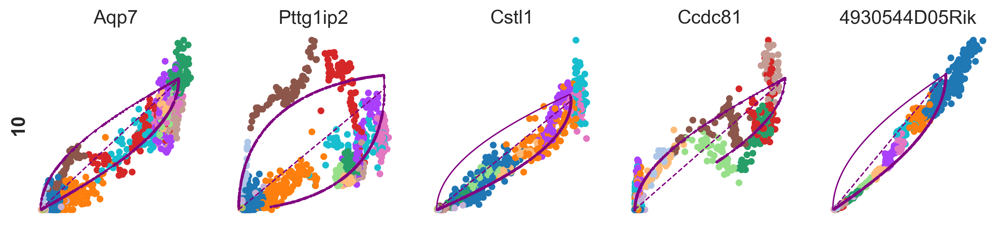

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

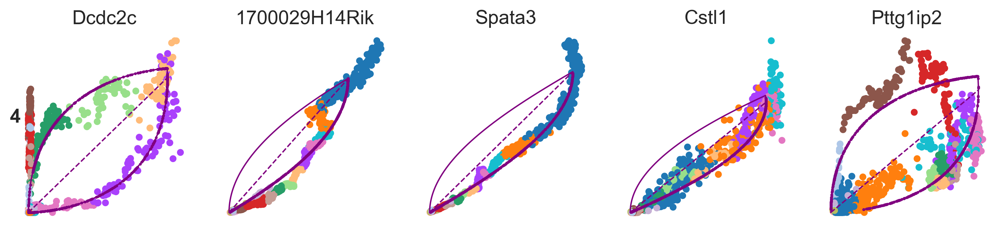

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

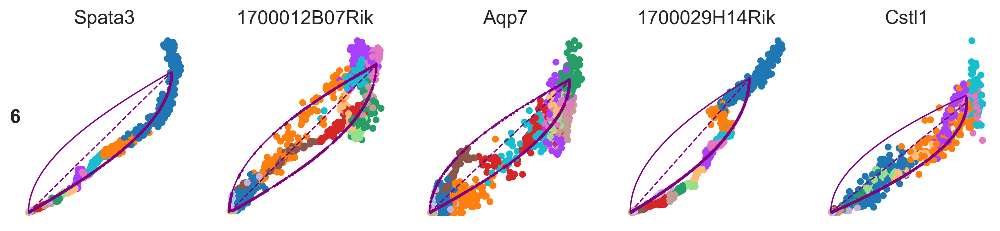

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

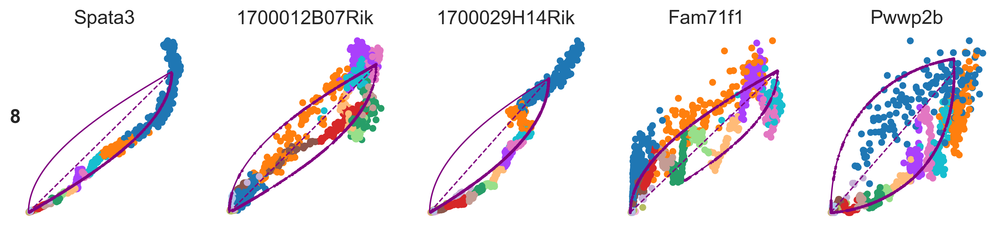

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

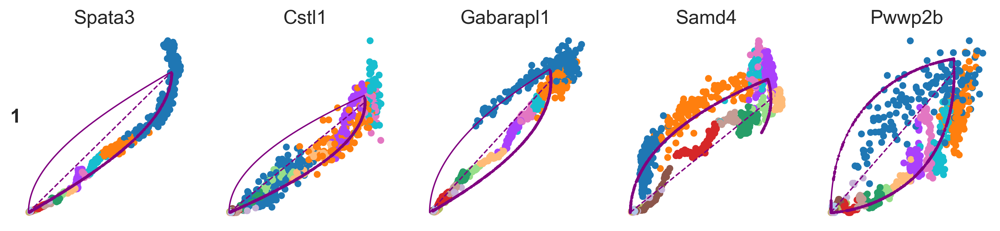

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

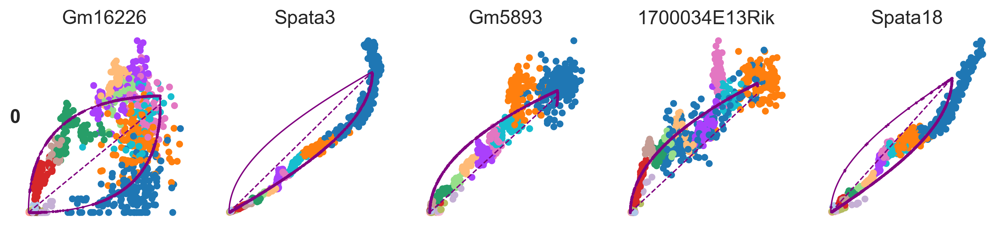

In [59]:
for cluster in ['10','4', '6', '8', '1', '0']:
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False, color = 'leiden')

In [69]:
scv.tl.differential_kinetic_test(adata, var_names=['Spata3'], groupby='leiden')


testing for differential kinetics
    finished (0:00:00) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)

outputs model fit of gene: Spata3


ВЕЛОСИТИ ДЛЯ ФИЛЬТРОВАННЫХ ДАННЫХ (adata_mt)

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


<Axes: title={'center': 'Clusters UMAP'}, xlabel='UMAP1', ylabel='UMAP2'>

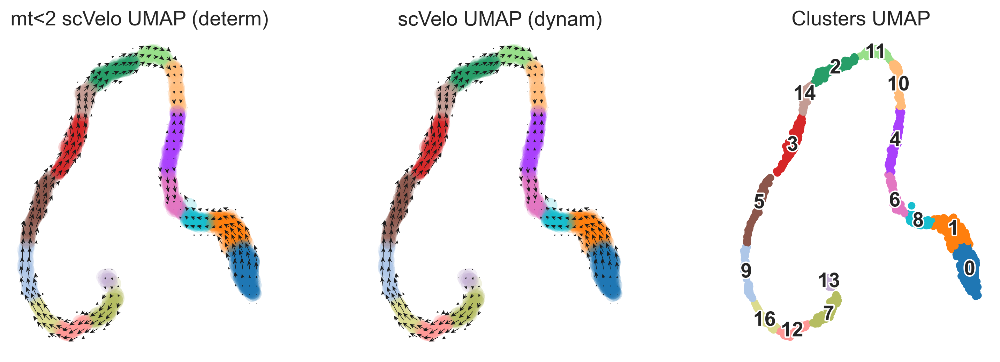

In [122]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,4), gridspec_kw={'wspace':0.4})

scv.pl.velocity_embedding_grid(adata_mt, color = 'leiden', basis="umap", arrow_size=3, arrow_length=2, arrow_color="k", title= "mt<2 scVelo UMAP (determ)", density=0.7, ax=ax1, show = False)
scv.pl.velocity_embedding_grid(adata_mt, basis="umap", color = 'leiden', arrow_size=3, arrow_length=2, arrow_color="k", title= "scVelo UMAP (dynam)", density=0.7, ax=ax2, show = False)
sc.pl.umap(adata_mt, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters UMAP", ax=ax3, show = False)

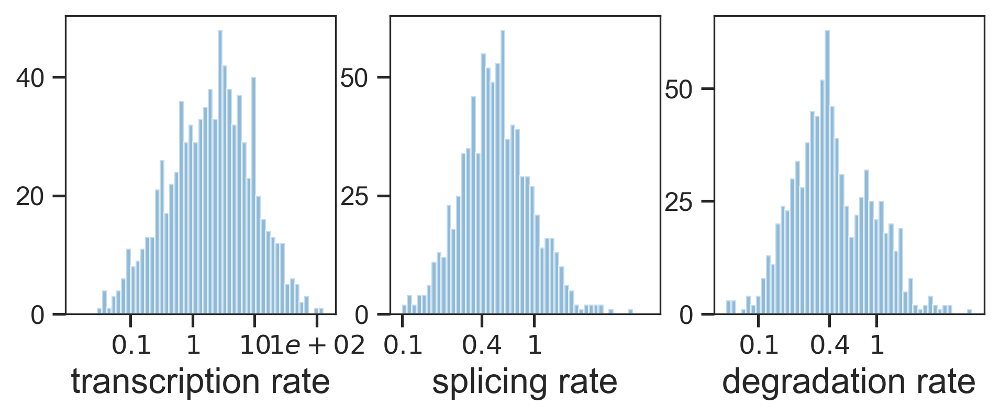

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
Uxs1,0.865061,0.991622,14.593833,0.314603,3.109989,0.050164,0.019320,0.471789,0.000206,0.0,0.0,0.478170,0.056175,1.309508,0.386997,1.290824
Mybl1,0.865226,3.120785,11.362720,0.891470,4.313199,0.039940,0.078529,0.929014,0.535200,0.0,0.0,0.476631,0.222233,1.903780,0.155820,0.991566
Catspere2,0.514279,0.237312,0.098376,0.157026,9.230634,4.353605,0.694818,0.276500,0.711277,0.0,0.0,0.456194,2.351703,0.595861,0.082695,3.467278
Smyd3,0.798359,0.271890,0.773687,0.318411,5.144264,0.649445,0.061868,0.150039,0.160554,0.0,0.0,0.485411,0.255469,0.477717,0.806914,2.552404
Shcbp1l,0.430943,19.701211,36.484001,0.278364,2.314615,0.038917,0.235938,9.230228,0.467207,0.0,0.0,0.496179,0.551080,22.454239,0.151339,0.868555


In [75]:
df = adata_mt.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata_mt, 'fit*', dropna=True).head()

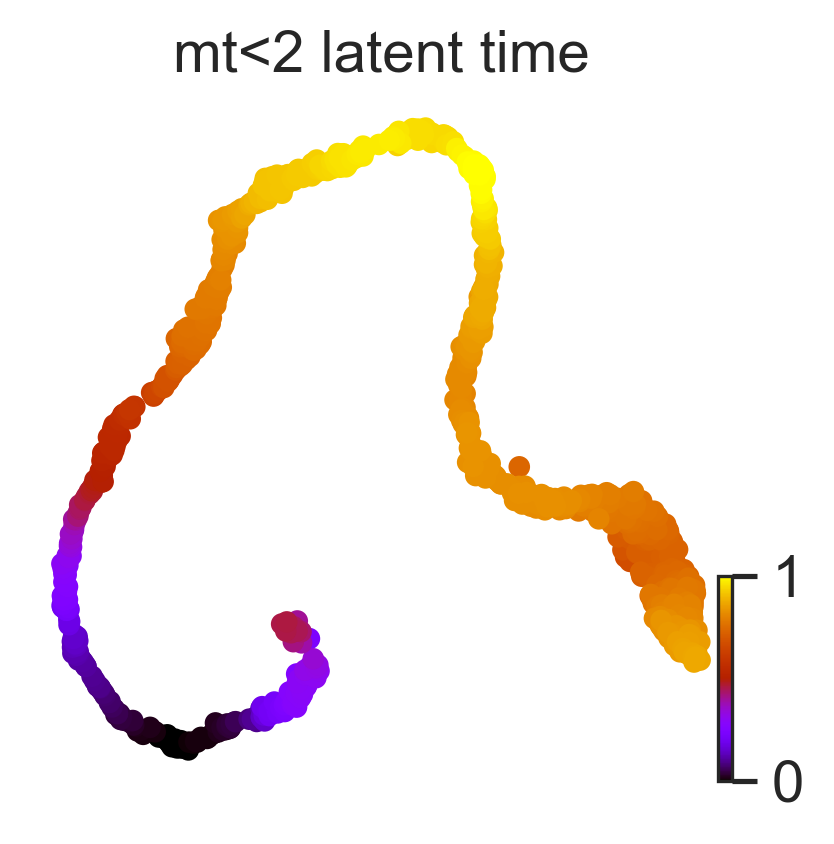

In [124]:
scv.tl.latent_time(adata_mt)
scv.pl.scatter(adata_mt, color='latent_time', color_map='gnuplot', figsize=(3,3), title = 'mt<2 latent time')

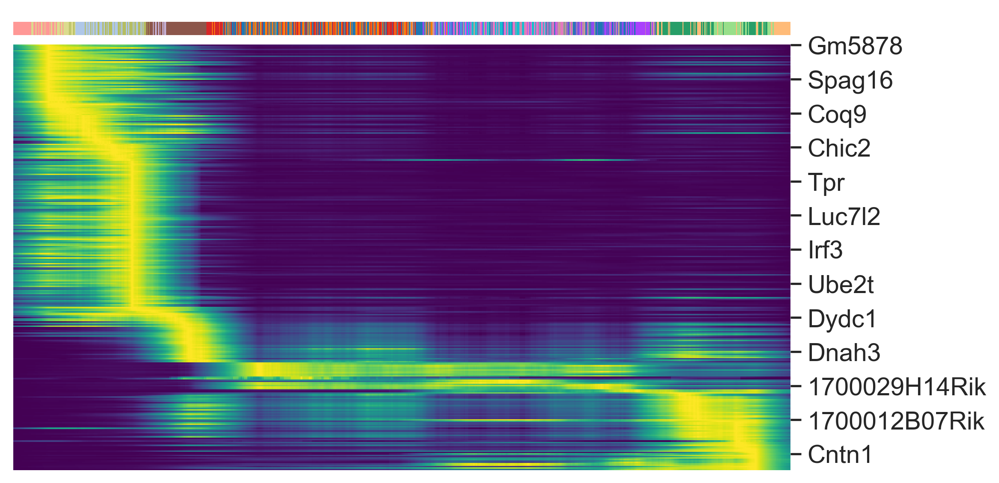

In [77]:
top_genes = adata_mt.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_mt, var_names=top_genes, sortby='latent_time', col_color='leiden', n_convolve=100)

Фильтрация на мтх каунты влиять на результат определения latent time следующим образом:
1) мтх риды всегда будут определяться как spliced (у мтх нет сплайсинга и интронов, а значит нет chimeric ридов)
2) spliced риды будут направлять определие latent time в бОльшую сторону (?)

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

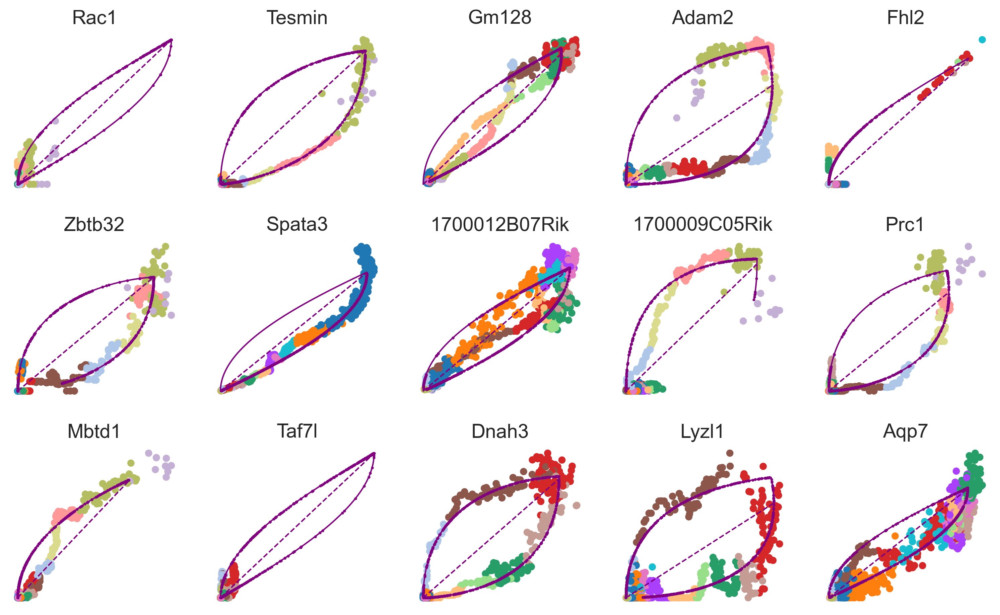

In [78]:
top_genes = adata_mt.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata_mt, basis=top_genes[:15], ncols=5, frameon=False, color = 'leiden')

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

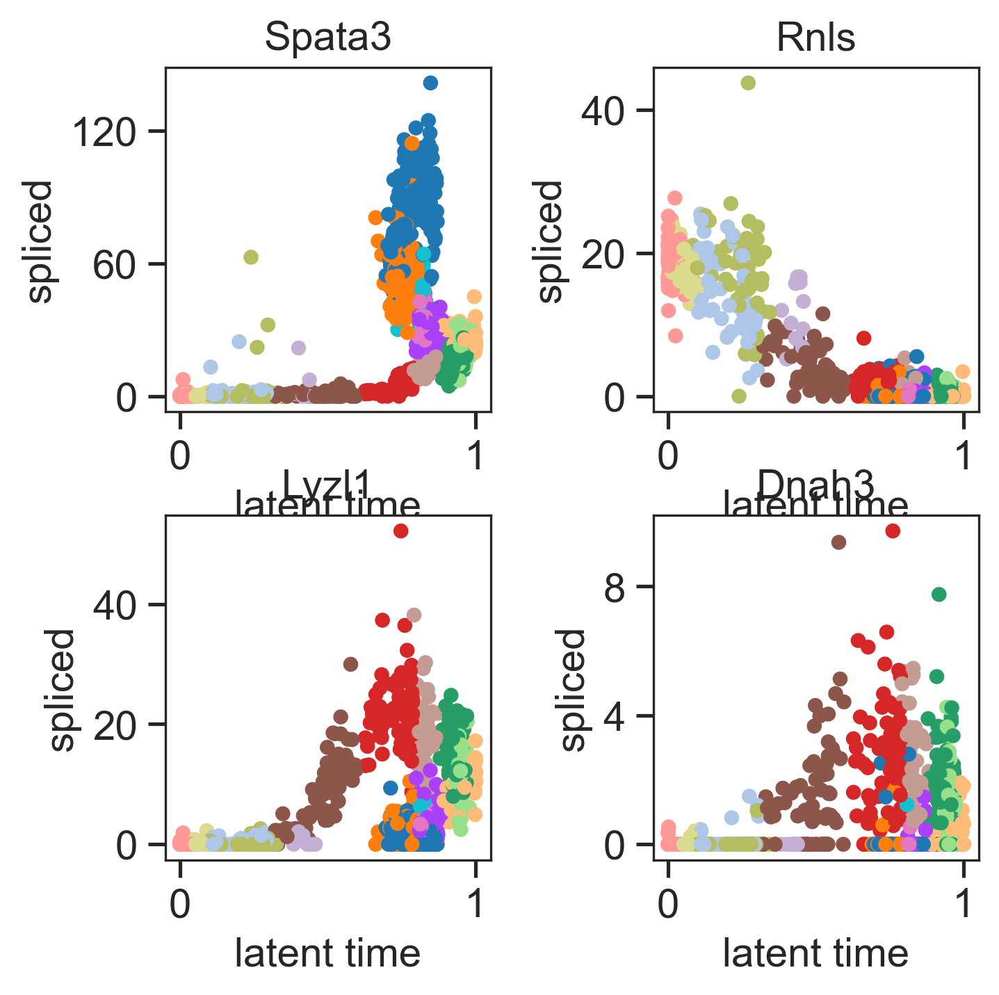

In [79]:
scv.pl.scatter(adata_mt, x='latent_time', y=['Spata3', 'Rnls', 'Lyzl1', 'Dnah3'], color = 'leiden', wspace = 0.5, ncols = 2)

УДАЛЕНИЕ МЕШАЮЩИХ ГЕНОВ (СОВЕТ С ГИТХАБА)

In [80]:
adata_spata3 = adata.copy()

In [ ]:
adata_spata3 = adata_spata3[:, ~adata_spata3.var_names.isin(['Spata3', 'Rac1', 'Gm128', 'Fhl2', 'Mbtd1', 'Taf7l'])]

In [ ]:
scv.tl.recover_dynamics(adata_spata3, n_jobs=2)
scv.tl.velocity(adata_spata3, mode="dynamical")
scv.tl.velocity_graph(adata_spata3)

<Axes: title={'center': 'Clusters UMAP'}, xlabel='UMAP1', ylabel='UMAP2'>

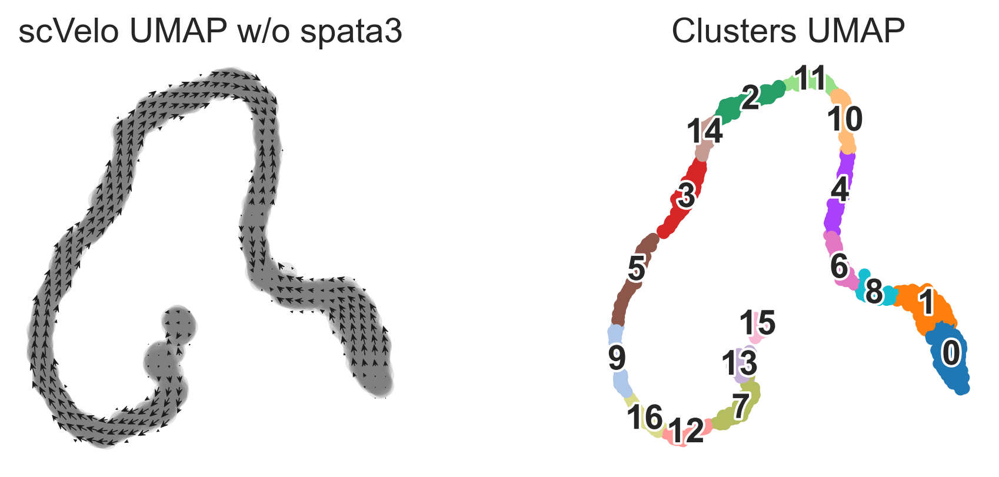

In [98]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7,3), gridspec_kw={'wspace':0.5})

scv.pl.velocity_embedding_grid(adata_spata3, basis="umap", arrow_size=3, arrow_length=2, arrow_color="k", title= "scVelo UMAP w/o spata3", density=0.7, ax=ax1, show = False)
sc.pl.umap(adata_spata3, color="leiden", legend_loc="on data", legend_fontoutline=2, frameon=False, title="Clusters UMAP", ax=ax2, show = False)

Тем не менее просто удалить ген Spata3 из датасета и перепрогнать велосити не помогло.

ДИФФЕРЕНЦИАЛЬНАЯ КИНЕТИКА

In [ ]:
scv.tl.differential_kinetic_test(adata, var_names=['Dcdc2c'], groupby='leiden')


In [85]:
scv.get_df(adata[:, 'Dcdc2c'], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)

,fit_diff_kinetics,fit_pval_kinetics
Dcdc2c,5,1.23e-10


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/dev

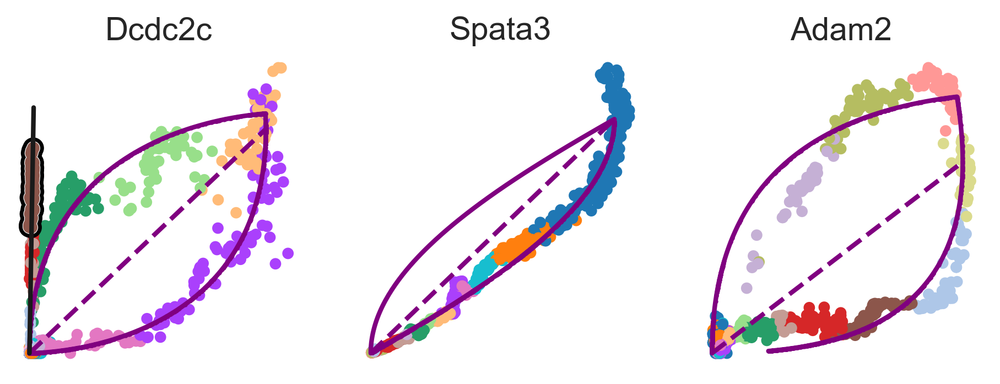

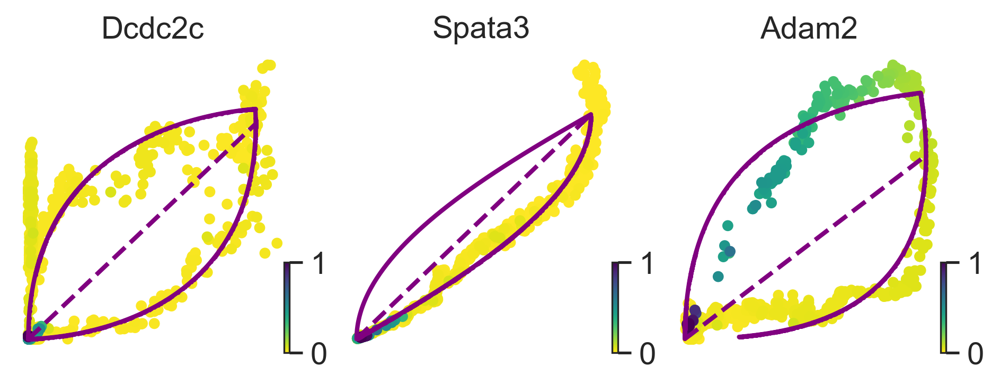

In [86]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(adata, basis=['Dcdc2c', 'Spata3', 'Adam2'], add_outline='fit_diff_kinetics', **kwargs)
scv.pl.scatter(adata, basis=['Dcdc2c', 'Spata3', 'Adam2'], add_outline='fit_diff_kinetics', color = 'latent_time', **kwargs)

ПЕРЕДЕЛАЕМ ВЕЛОСИТИ С УЧЕТОМ ВОЗМОЖНОСТИ ДИФФЕРЕНЦИАЛЬНОЙ КИНЕТИКИ

In [87]:
adata_diff = adata.copy()

In [ ]:
scv.tl.velocity(adata_diff, diff_kinetics=True)
scv.tl.velocity_graph(adata_diff)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


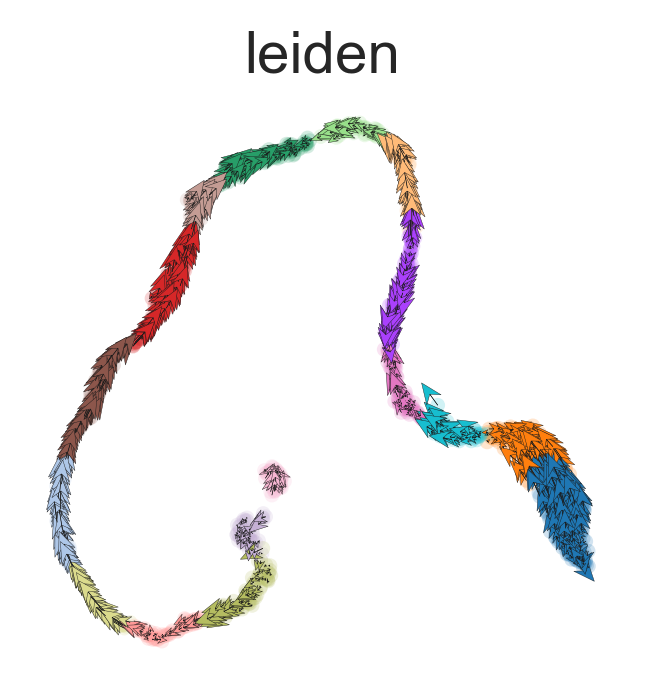

In [89]:
scv.pl.velocity_embedding(adata_diff, arrow_size=6, arrow_length=6, color = 'leiden')

In [ ]:
!pip install tensorflow

In [91]:
import tensorflow as tf

In [ ]:
pip install unitvelo

In [93]:
import unitvelo as utv

(Running UniTVelo 0.2.5.2)
2023-12-14 19:30:54


In [94]:
velo = utv.config.Configuration()
velo.R2_ADJUST = True 
velo.IROOT = None
velo.FIT_OPTION = '1'
velo.GPU = 0

------> Manully Specified Parameters <------
------> Model Configuration Settings <------
N_TOP_GENES:	2000
LEARNING_RATE:	0.01
FIT_OPTION:	1
DENSITY:	SVD
REORDER_CELL:	Soft_Reorder
AGGREGATE_T:	True
R2_ADJUST:	True
GENE_PRIOR:	None
VGENES:	basic
IROOT:	None
--------------------------------------------

Current working dir is /Users/karina/projects/scRNAseq.
Results will be stored in res folder


Filtered out 370 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
Logarithmized X.
Extracted 1630 highly variable genes.
Computing moments for 1630 genes with n_neighbors: 30 and n_pcs: 30
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)

# of velocity genes 1114 (Criterion: positive regression coefficient between un/spliced counts)
# of velocity genes 1061 (Criterion: std of un/spliced reads should be moderate, w/o extreme values)
# of velocity genes 1034 (Criterion: genes have reads in more than 5% of total cells)
No GPU device has been detected. Switch to CPU mode.


/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
Loss (Total): 22611.493, (Spliced): 11650.311, (Unspliced): 10961.182: 100%|█████████▉| 11998/12000 [12:09<00:00, 17.87it/s] 

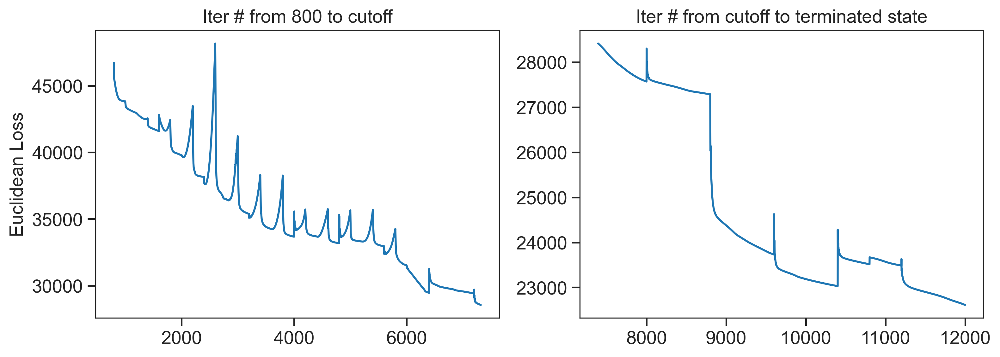

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
Loss (Total): 22611.493, (Spliced): 11650.311, (Unspliced): 10961.182: 100%|█████████▉| 11999/12000 [12:22<00:00, 16.17it/s]

Total loss 22611.493, vgene loss 22611.493



/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:528: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)


  0%|          | 0/1208 [00:00<?, ?cells/s]

... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


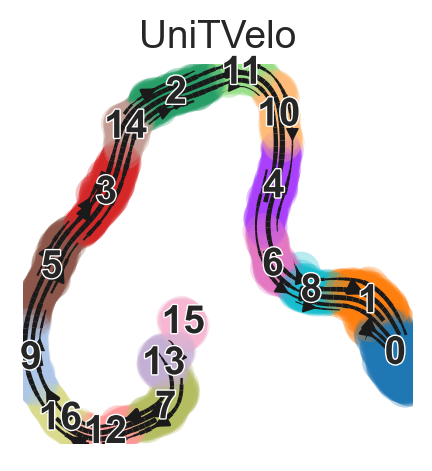

In [95]:
adata = utv.run_model(adata_uni, ['leiden'], config_file=velo)

/Users/karina/miniconda3/envs/jpt/lib/python3.11/site-packages/pandas/core/algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])


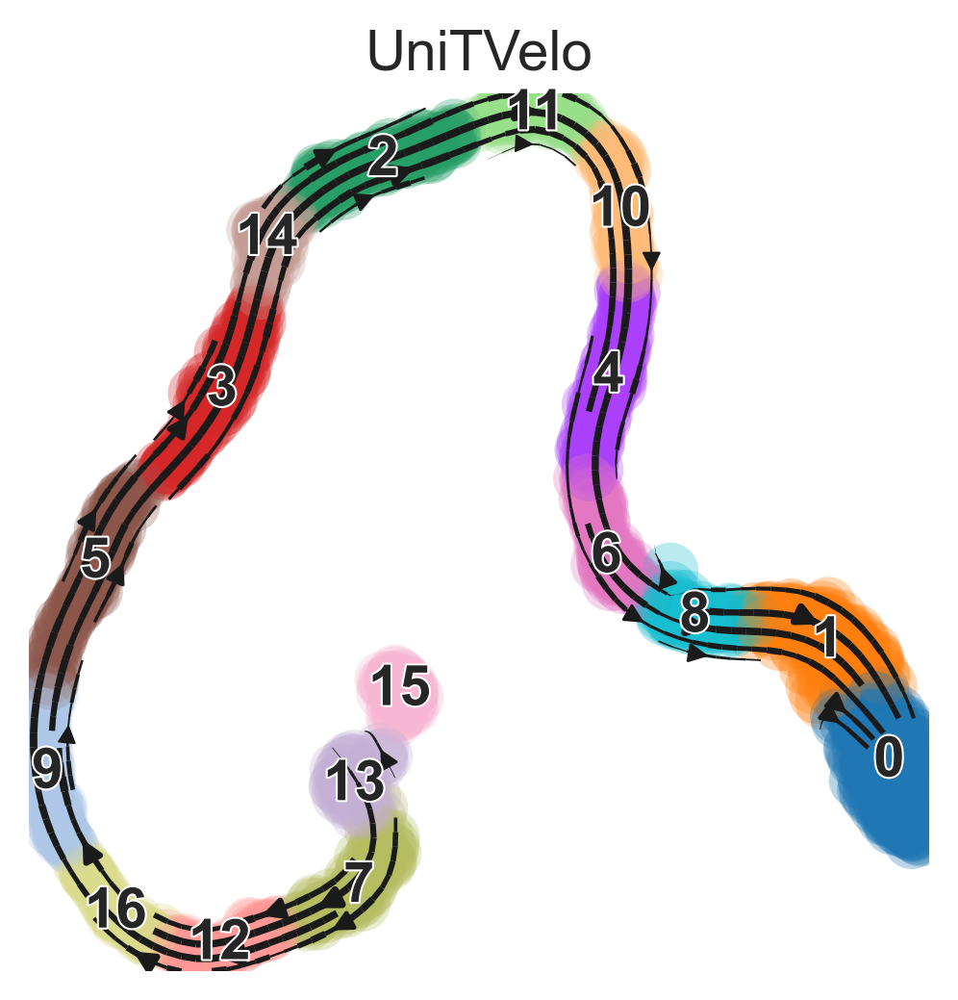

In [102]:
scv.pl.velocity_embedding_stream(adata_uni, color='leiden', dpi=150, title='UniTVelo', figsize = (4,4), frameon=False)

этот метод отработал блестяще! Значит проблема тут все-таки скорее была в несовершенстве scVelo 